# COMP90086 Workshop 3

In this workshop, you will have some practice of spatial filtering and frequency filtering on images.

Table of Contents

- Spatial Filtering
    - Standard filtering: blur, sharpen and edges
    - Cross-correlation vs. Convolution
    - Derivative of Gaussian
    - Handle border effect
   
- Frequency Filtering
    - Fourier transformation
    - Swap magnitude/phase
    - Fourier transform a filter 
    - Gaussian lowpass filter in the frequency domain
    


# Spatial Filtering

## (1) Standard filtering: blur, sharpen and edge detection

In [1]:
import os
import numpy as np
import cv2  
from matplotlib import pyplot as plt


### Blur

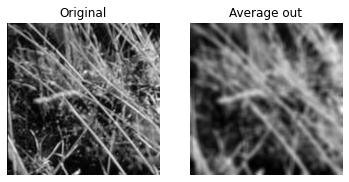

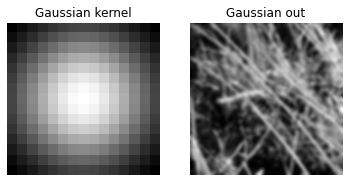

In [2]:
rootpath='./'
img= cv2.imread(os.path.join(rootpath, "img1.png"),cv2.IMREAD_GRAYSCALE) 
# average filter
avg_kernel = np.ones((15,15),np.float32)/225
avg_out = cv2.filter2D(img,-1,avg_kernel)

# Gaussian filter size 15
gau_kernel = cv2.getGaussianKernel(15,5)# 1d gaussian kernel (size, sigma)
gau_kern2d = np.outer(gau_kernel, gau_kernel)
gau_kern2d=gau_kern2d/gau_kern2d.sum()
gau_out = cv2.filter2D(img,-1,gau_kern2d)
 
  
    
plt.subplot(1,2,1)
plt.imshow(img,cmap='gray') 
plt.title('Original')
plt.axis('off')

plt.subplot(1,2,2)
plt.imshow(avg_out,cmap='gray') 
plt.title('Average out')
plt.axis('off')
plt.show()

plt.subplot(1,2,1)
plt.imshow(gau_kern2d,cmap='gray' )
plt.title('Gaussian kernel')
plt.axis('off')

 
plt.subplot(1,2,2)
plt.imshow(gau_out,cmap='gray') 
plt.title('Gaussian out')
plt.axis('off')
plt.show()


### Shapen

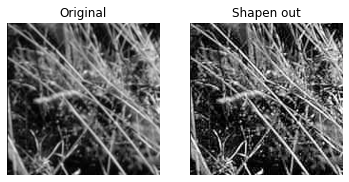

In [3]:
shap_kernel = np.array([[-1,-1,-1], [-1,9,-1], [-1,-1,-1]])  
#shap_kernel = np.array([[0,-1,0], [-1,5,-1], [0,-1,0]])  
shapen_out= cv2.filter2D(img, -1, shap_kernel)

 
plt.subplot(1,2,1)
plt.imshow(img,cmap='gray') 
plt.title('Original')
plt.axis('off')

plt.subplot(1,2,2)
plt.imshow(shapen_out,cmap='gray') 
plt.title('Shapen out')
plt.axis('off')
 

plt.show()

### Edge detection

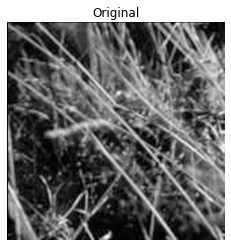

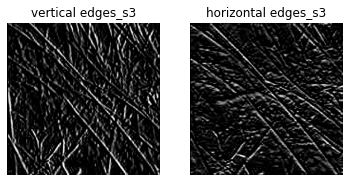

In [4]:
 
#edge_out_y3= cv2.Sobel(img,cv2.CV_8U,1,0,ksize=3)
#edge_out_x3= cv2.Sobel(img,cv2.CV_8U,0,1,ksize=3)

sobel_kernel_x =  np.array([[1,0,-1], [2,0,-2], [1,0,-1]])   
sobel_kernel_y =  np.array([[1,2,1], [0,0,0], [-1,-2,-1]])   



sobel_out_x = cv2.filter2D(img,-1,sobel_kernel_x)
sobel_out_y = cv2.filter2D(img,-1,sobel_kernel_y)



#plt.subplot(1,1,1)
plt.imshow(img,cmap='gray') 
plt.title('Original')
plt.axis('off')
plt.show()

plt.subplot(1,2,1)
plt.imshow(sobel_out_x,cmap='gray') 
plt.title('vertical edges_s3')
plt.axis('off')
 
plt.subplot(1,2,2)
plt.imshow(sobel_out_y,cmap='gray') 
plt.title('horizontal edges_s3')
plt.axis('off')

plt.show()



## (2) Cross-correlation vs. Convolution

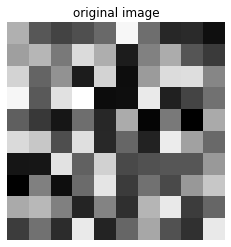

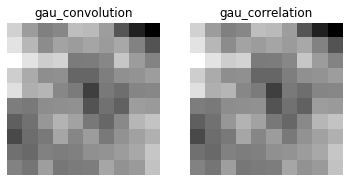

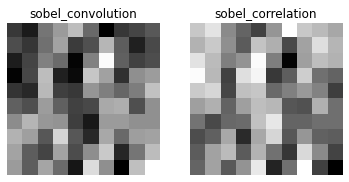

In [5]:

#cv2.filter2D accutually does correlation
#to compare convolution and correlation,we use scipy.signal, which contains both convolution and correlation

from scipy import signal


imgr= np.random.randint(255, size=(10,10),dtype=np.uint8) #random  a small image

plt.imshow(imgr,cmap='gray') 
plt.title('original image')
plt.axis('off')
plt.show()  

# gaussian filter

gau_kernel = cv2.getGaussianKernel(3,3)# 1d gaussian kernel (size, sigma)
gau_kern2d = np.outer(gau_kernel, gau_kernel )
gau_kern2d = gau_kern2d/gau_kern2d.sum()

#gau_out_corr = cv2.filter2D(imgr,-1,gau_kern2d,borderType=cv2.BORDER_REFLECT) #correlation
gau_out_corr = signal.correlate2d(imgr, gau_kern2d, boundary='symm', mode='same') #correlation

#gau_kern2d_conv=np.flip(gau_kern2d)
#gau_out_conv = cv2.filter2D(imgr,-1,gau_kern2d_conv)  
gau_out_conv = signal.convolve2d(imgr, gau_kern2d, boundary='symm', mode='same') #convolution


 
plt.subplot(1,2,1)
plt.imshow(gau_out_conv,cmap='gray') 
plt.title('gau_convolution')
plt.axis('off')
 
plt.subplot(1,2,2)
plt.imshow(gau_out_corr,cmap='gray') 
plt.title('gau_correlation')
plt.axis('off') 

plt.show() # the kernel is symmetric, so the outputs are the same
 

sobel_kernel =  np.array([[1,0,-1], [2,0,-2], [1,0,-1]])   
#sobel_out_corr = cv2.filter2D(imgr,-1,sobel_kernel,borderType=cv2.BORDER_REFLECT)
sobel_out_corr = signal.correlate2d(imgr, sobel_kernel, boundary='symm', mode='same') #correlation

#sobel_kernel_conv = np.flip(sobel_kernel)
#sobel_out_conv = cv2.filter2D(imgr,-1,sobel_kernel_conv)
sobel_out_conv = signal.convolve2d(imgr, sobel_kernel, boundary='symm', mode='same') #convolution

plt.subplot(1,2,1)
plt.imshow(sobel_out_conv,cmap='gray') 
plt.title('sobel_convolution')
plt.axis('off')
 
plt.subplot(1,2,2)
plt.imshow(sobel_out_corr,cmap='gray') 
plt.title('sobel_correlation')
plt.axis('off') 

plt.show() # the kernel is asymmetric, so the outputs are different



## (3) Derivative of Gaussian

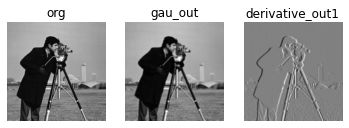

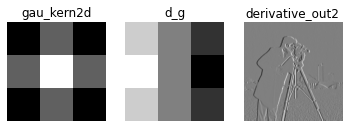

In [6]:

from scipy import signal

rootpath='./'
img2= cv2.imread(os.path.join(rootpath, "img2.png"),cv2.IMREAD_GRAYSCALE) 
 
gau_kernel = cv2.getGaussianKernel(3,1)#  
gau_kern2d = np.outer(gau_kernel, gau_kernel)
gau_kern2d=gau_kern2d/np.abs(gau_kern2d).sum()


gau_out=signal.convolve2d(img2,gau_kern2d, boundary='symm', mode='same')
derivative_out1=np.gradient(gau_out,axis=1)


plt.subplot(1,3,1)
plt.imshow(img2,cmap='gray') 
plt.title('org')
plt.axis('off')


plt.subplot(1,3,2)
plt.imshow(gau_out,cmap='gray') 
plt.title('gau_out')
plt.axis('off')
 
plt.subplot(1,3,3)
plt.imshow(derivative_out1,cmap='gray') 
plt.title('derivative_out1')
plt.axis('off') 

plt.show()  

d_g=np.gradient(gau_kern2d,axis=1) 
derivative_out2=signal.convolve2d(img2,d_g, boundary='symm', mode='same')

plt.subplot(1,3,1)
plt.imshow(gau_kern2d,cmap='gray') 
plt.title('gau_kern2d')
plt.axis('off')


plt.subplot(1,3,2)
plt.imshow(d_g,cmap='gray') 
plt.title('d_g')
plt.axis('off')
 
plt.subplot(1,3,3)
plt.imshow(derivative_out2,cmap='gray') 
plt.title('derivative_out2')
plt.axis('off') 

plt.show() 


## (4) Handle border effect

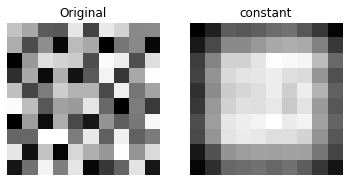

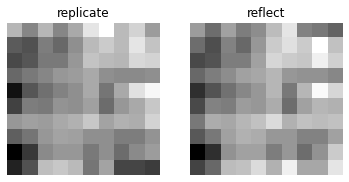

In [7]:

img= np.random.randint(255, size=(10,10),dtype=np.uint8) #random  a small image

gau_kernel = cv2.getGaussianKernel(5,5)# 1d gaussian kernel (size, sigma)
gau_kern2d = np.outer(gau_kernel, gau_kernel)
gau_kern2d = gau_kern2d/gau_kern2d.sum()

gau_out1 = cv2.filter2D(img,-1,gau_kern2d, borderType = cv2.BORDER_CONSTANT ) #pad with constant
gau_out2 = cv2.filter2D(img,-1,gau_kern2d, borderType =cv2.BORDER_REPLICATE) #replicate
gau_out3 = cv2.filter2D(img,-1,gau_kern2d, borderType =cv2.BORDER_REFLECT) #reflect

plt.subplot(1,2,1)   
plt.imshow(img ,cmap='gray')  
plt.title('Original')
plt.axis('off')
                
plt.subplot(1,2,2)
plt.imshow(gau_out1,cmap='gray')  
plt.title('constant')
plt.axis('off')

plt.show()

plt.subplot(1,2,1)
plt.imshow(gau_out2,cmap='gray') 
plt.title('replicate')
plt.axis('off')

 
plt.subplot(1,2,2)
plt.imshow(gau_out3,cmap='gray') 
plt.title('reflect')
plt.axis('off')
plt.show()


# Frequency Filtering

## (1) Fourier transformation

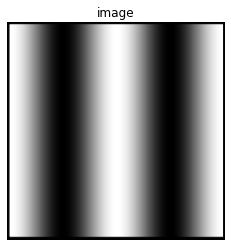

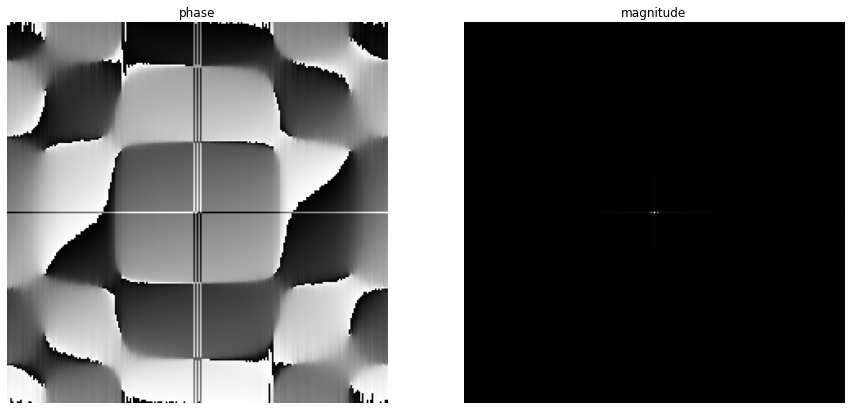

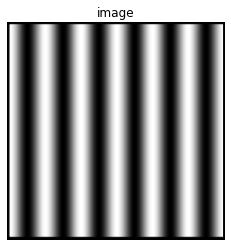

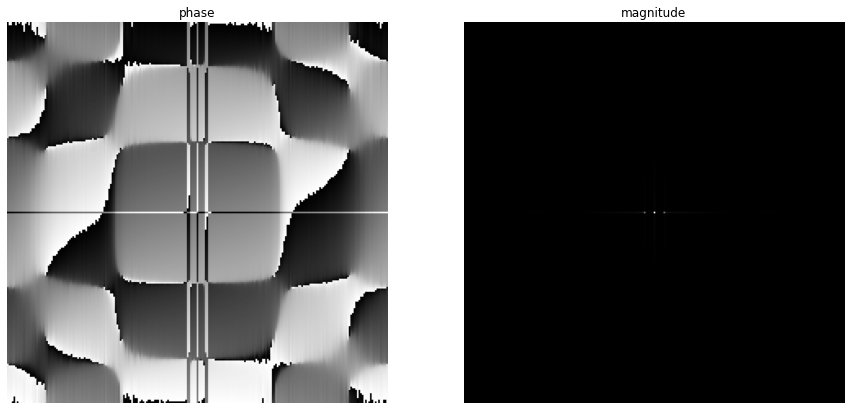

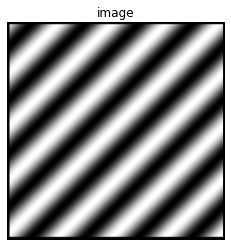

...

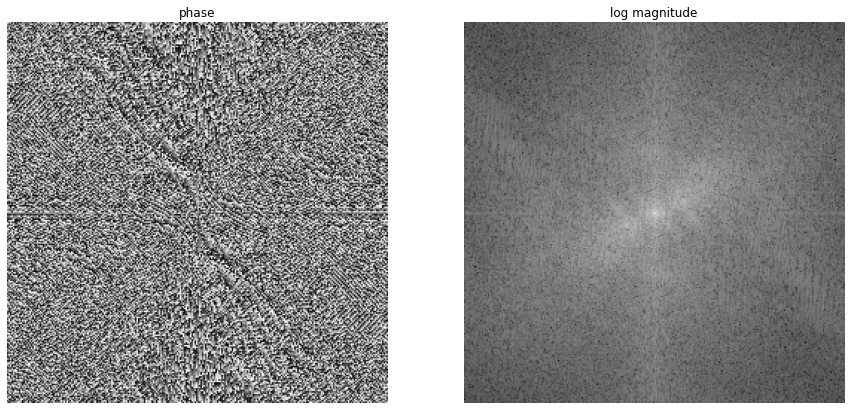

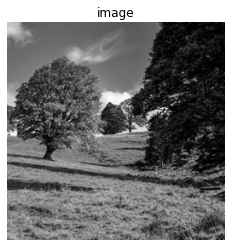

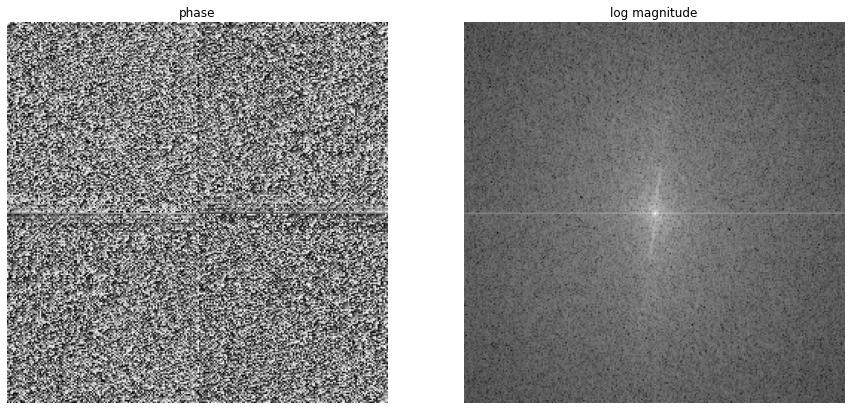

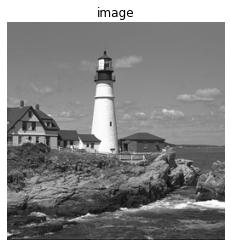

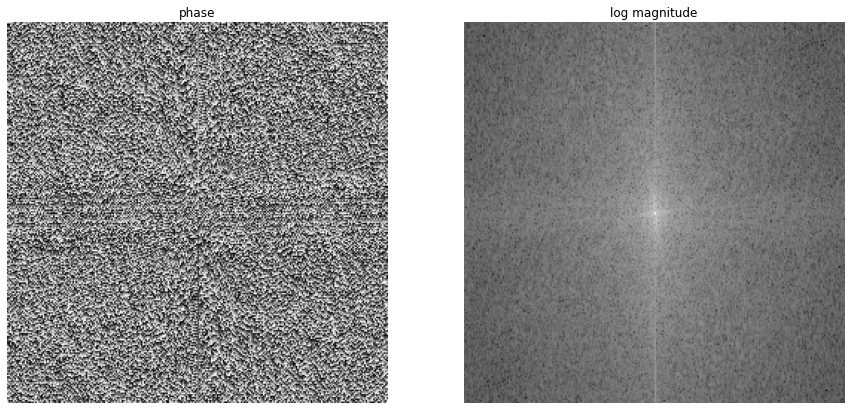

In [8]:
rootpath='./'
 
img= cv2.imread(os.path.join(rootpath, "F1.1.png"),cv2.IMREAD_GRAYSCALE) 

# Fourier transform
f = np.fft.fft2(img)
f = np.fft.fftshift(f)

 

# Fourier phase and magnitude
phase = np.angle(f)
magnitude = np.abs(f)



plt.imshow(img ,cmap='gray')  
plt.title('image')
plt.axis('off')
plt.show()
             
fig,axs = plt.subplots(1,2)
fig.set_figwidth(15)
fig.set_figheight(15)
plt.subplot(1,2,1)
plt.imshow(phase ,cmap='gray')  
plt.title('phase')
plt.axis('off')

plt.subplot(1,2,2)
plt.imshow(magnitude ,cmap='gray')  
plt.title('magnitude')
plt.axis('off')

plt.show()


img= cv2.imread(os.path.join(rootpath, "F1.2.png"),cv2.IMREAD_GRAYSCALE) 

# Fourier transform
f = np.fft.fft2(img)
f = np.fft.fftshift(f)
 


# Fourier phase and magnitude
phase = np.angle(f)
magnitude = np.abs(f)



plt.imshow(img ,cmap='gray')  
plt.title('image')
plt.axis('off')
plt.show()
             
fig,axs = plt.subplots(1,2)
fig.set_figwidth(15)
fig.set_figheight(15)
plt.subplot(1,2,1)
plt.imshow(phase ,cmap='gray')  
plt.title('phase')
plt.axis('off')

plt.subplot(1,2,2)
plt.imshow(magnitude,cmap='gray')  
plt.title('magnitude')
plt.axis('off')

plt.show()

img= cv2.imread(os.path.join(rootpath, "F1.3.png"),cv2.IMREAD_GRAYSCALE) 

# Fourier transform
f = np.fft.fft2(img)
f = np.fft.fftshift(f)

# Fourier phase and magnitude
phase = np.angle(f)
magnitude = np.abs(f)



plt.imshow(img ,cmap='gray')  
plt.title('image')
plt.axis('off')
plt.show()
             
fig,axs = plt.subplots(1,2)
fig.set_figwidth(15)
fig.set_figheight(15)
plt.subplot(1,2,1)
plt.imshow(phase ,cmap='gray')  
plt.title('phase')
plt.axis('off')

plt.subplot(1,2,2)
plt.imshow(magnitude ,cmap='gray')  
plt.title('magnitude')
plt.axis('off')

plt.show()

img= cv2.imread(os.path.join(rootpath, "F1.4.png"),cv2.IMREAD_GRAYSCALE) 

# Fourier transform
f = np.fft.fft2(img)
f = np.fft.fftshift(f)

# Fourier phase and magnitude
phase = np.angle(f)
magnitude = np.log(np.abs(f))# the orginal magnitute is too small, we show log of the value to make it clear
#



plt.imshow(img ,cmap='gray')  
plt.title('image')
plt.axis('off')
plt.show()
             
fig,axs = plt.subplots(1,2)
fig.set_figwidth(15)
fig.set_figheight(15)
plt.subplot(1,2,1)
plt.imshow(phase ,cmap='gray')  
plt.title('phase')
plt.axis('off')

plt.subplot(1,2,2)
plt.imshow(magnitude ,cmap='gray')  
plt.title('log magnitude')
plt.axis('off')

plt.show()

img= cv2.imread(os.path.join(rootpath, "F1.5.png"),cv2.IMREAD_GRAYSCALE) 

# Fourier transform
f = np.fft.fft2(img)
f = np.fft.fftshift(f)



# Fourier phase and magnitude
phase = np.angle(f)
magnitude = np.log(np.abs(f))# the orginal magnitute is too small, we show log of the value to make it clear
#


plt.imshow(img ,cmap='gray')  
plt.title('image')
plt.axis('off')
plt.show()
 
fig,axs = plt.subplots(1,2)
fig.set_figwidth(15)
fig.set_figheight(15)
plt.subplot(1,2,1)
plt.imshow(phase ,cmap='gray')    
plt.title('phase')
plt.axis('off')

plt.subplot(1,2,2)
plt.imshow(magnitude ,cmap='gray')  
plt.title('log magnitude')
plt.axis('off')

plt.show()


img= cv2.imread(os.path.join(rootpath, "F1.6.png"),cv2.IMREAD_GRAYSCALE) 

# Fourier transform
f = np.fft.fft2(img)
f = np.fft.fftshift(f)



# Fourier phase and magnitude
phase = np.angle(f)
magnitude = np.log(np.abs(f))# the orginal magnitute is too small, we show log of the value to make it clear
#


plt.imshow(img ,cmap='gray')  
plt.title('image')
plt.axis('off')
plt.show()
 
fig,axs = plt.subplots(1,2)
fig.set_figwidth(15)
fig.set_figheight(15)
plt.subplot(1,2,1)
plt.imshow(phase ,cmap='gray')    
plt.title('phase')
plt.axis('off')

plt.subplot(1,2,2)
plt.imshow(magnitude ,cmap='gray')  
plt.title('log magnitude')
plt.axis('off')

plt.show()



img= cv2.imread(os.path.join(rootpath, "F1.7.png"),cv2.IMREAD_GRAYSCALE) 

# Fourier transform
f = np.fft.fft2(img)
f = np.fft.fftshift(f)



# Fourier phase and magnitude
phase = np.angle(f)
magnitude = np.log(np.abs(f))# the orginal magnitute is too small, we show log of the value to make it clear
#


plt.imshow(img ,cmap='gray')  
plt.title('image')
plt.axis('off')
plt.show()
 
fig,axs = plt.subplots(1,2)
fig.set_figwidth(15)
fig.set_figheight(15)
plt.subplot(1,2,1)
plt.imshow(phase ,cmap='gray')    
plt.title('phase')
plt.axis('off')

plt.subplot(1,2,2)
plt.imshow(magnitude ,cmap='gray')  
plt.title('log magnitude')
plt.axis('off')

plt.show()



img= cv2.imread(os.path.join(rootpath, "F1.8.png"),cv2.IMREAD_GRAYSCALE) 

# Fourier transform
f = np.fft.fft2(img)
f = np.fft.fftshift(f)



# Fourier phase and magnitude
phase = np.angle(f)
magnitude = np.log(np.abs(f))# the orginal magnitute is too small, we show log of the value to make it clear
#


plt.imshow(img ,cmap='gray')  
plt.title('image')
plt.axis('off')
plt.show()
 
fig,axs = plt.subplots(1,2)
fig.set_figwidth(15)
fig.set_figheight(15)
plt.subplot(1,2,1)
plt.imshow(phase ,cmap='gray')    
plt.title('phase')
plt.axis('off')

plt.subplot(1,2,2)
plt.imshow(magnitude ,cmap='gray')  
plt.title('log magnitude')
plt.axis('off')

plt.show()

img= cv2.imread(os.path.join(rootpath, "F1.9.png"),cv2.IMREAD_GRAYSCALE) 

# Fourier transform
f = np.fft.fft2(img)
f = np.fft.fftshift(f)



# Fourier phase and magnitude
phase = np.angle(f)
magnitude = np.log(np.abs(f))# the orginal magnitute is too small, we show log of the value to make it clear
#


plt.imshow(img ,cmap='gray')  
plt.title('image')
plt.axis('off')
plt.show()
 
fig,axs = plt.subplots(1,2)
fig.set_figwidth(15)
fig.set_figheight(15)
plt.subplot(1,2,1)
plt.imshow(phase ,cmap='gray')    
plt.title('phase')
plt.axis('off')

plt.subplot(1,2,2)
plt.imshow(magnitude ,cmap='gray')  
plt.title('log magnitude')
plt.axis('off')

plt.show()

img= cv2.imread(os.path.join(rootpath, "F1.10.png"),cv2.IMREAD_GRAYSCALE) 

# Fourier transform
f = np.fft.fft2(img)
f = np.fft.fftshift(f)



# Fourier phase and magnitude
phase = np.angle(f)
magnitude = np.log(np.abs(f))# the orginal magnitute is too small, we show log of the value to make it clear
#


plt.imshow(img ,cmap='gray')  
plt.title('image')
plt.axis('off')
plt.show()
 
fig,axs = plt.subplots(1,2)
fig.set_figwidth(15)
fig.set_figheight(15)
plt.subplot(1,2,1)
plt.imshow(phase ,cmap='gray')    
plt.title('phase')
plt.axis('off')

plt.subplot(1,2,2)
plt.imshow(magnitude ,cmap='gray')  
plt.title('log magnitude')
plt.axis('off')

plt.show()


img= cv2.imread(os.path.join(rootpath, "F1.11.png"),cv2.IMREAD_GRAYSCALE) 

# Fourier transform
f = np.fft.fft2(img)
f = np.fft.fftshift(f)



# Fourier phase and magnitude
phase = np.angle(f)
magnitude = np.log(np.abs(f))# the orginal magnitute is too small, we show log of the value to make it clear
#


plt.imshow(img ,cmap='gray')  
plt.title('image')
plt.axis('off')
plt.show()
 
fig,axs = plt.subplots(1,2)
fig.set_figwidth(15)
fig.set_figheight(15)
plt.subplot(1,2,1)
plt.imshow(phase ,cmap='gray')    
plt.title('phase')
plt.axis('off')

plt.subplot(1,2,2)
plt.imshow(magnitude ,cmap='gray')  
plt.title('log magnitude')
plt.axis('off')

plt.show()

img= cv2.imread(os.path.join(rootpath, "F1.12.png"),cv2.IMREAD_GRAYSCALE) 

# Fourier transform
f = np.fft.fft2(img)
f = np.fft.fftshift(f)



# Fourier phase and magnitude
phase = np.angle(f)
magnitude = np.log(np.abs(f))# the orginal magnitute is too small, we show log of the value to make it clear
#


plt.imshow(img ,cmap='gray')  
plt.title('image')
plt.axis('off')
plt.show()
 
fig,axs = plt.subplots(1,2)
fig.set_figwidth(15)
fig.set_figheight(15)
plt.subplot(1,2,1)
plt.imshow(phase ,cmap='gray')    
plt.title('phase')
plt.axis('off')

plt.subplot(1,2,2)
plt.imshow(magnitude ,cmap='gray')  
plt.title('log magnitude')
plt.axis('off')

plt.show()

img= cv2.imread(os.path.join(rootpath, "F1.13.png"),cv2.IMREAD_GRAYSCALE) 

# Fourier transform
f = np.fft.fft2(img)
f = np.fft.fftshift(f)



# Fourier phase and magnitude
phase = np.angle(f)
magnitude = np.log(np.abs(f))# the orginal magnitute is too small, we show log of the value to make it clear
#


plt.imshow(img ,cmap='gray')  
plt.title('image')
plt.axis('off')
plt.show()
 
fig,axs = plt.subplots(1,2)
fig.set_figwidth(15)
fig.set_figheight(15)
plt.subplot(1,2,1)
plt.imshow(phase ,cmap='gray')    
plt.title('phase')
plt.axis('off')

plt.subplot(1,2,2)
plt.imshow(magnitude ,cmap='gray')  
plt.title('log magnitude')
plt.axis('off')

plt.show()

img= cv2.imread(os.path.join(rootpath, "F1.14.png"),cv2.IMREAD_GRAYSCALE) 

# Fourier transform
f = np.fft.fft2(img)
f = np.fft.fftshift(f)



# Fourier phase and magnitude
phase = np.angle(f)
magnitude = np.log(np.abs(f))# the orginal magnitute is too small, we show log of the value to make it clear
#


plt.imshow(img ,cmap='gray')  
plt.title('image')
plt.axis('off')
plt.show()
 
fig,axs = plt.subplots(1,2)
fig.set_figwidth(15)
fig.set_figheight(15)
plt.subplot(1,2,1)
plt.imshow(phase ,cmap='gray')    
plt.title('phase')
plt.axis('off')

plt.subplot(1,2,2)
plt.imshow(magnitude ,cmap='gray')  
plt.title('log magnitude')
plt.axis('off')

plt.show()

img= cv2.imread(os.path.join(rootpath, "F1.15.png"),cv2.IMREAD_GRAYSCALE) 

# Fourier transform
f = np.fft.fft2(img)
f = np.fft.fftshift(f)



# Fourier phase and magnitude
phase = np.angle(f)
magnitude = np.log(np.abs(f))# the orginal magnitute is too small, we show log of the value to make it clear
#


plt.imshow(img ,cmap='gray')  
plt.title('image')
plt.axis('off')
plt.show()
 
fig,axs = plt.subplots(1,2)
fig.set_figwidth(15)
fig.set_figheight(15)
plt.subplot(1,2,1)
plt.imshow(phase ,cmap='gray')    
plt.title('phase')
plt.axis('off')

plt.subplot(1,2,2)
plt.imshow(magnitude ,cmap='gray')  
plt.title('log magnitude')
plt.axis('off')

plt.show()

## (2) Swap magnitude/phase

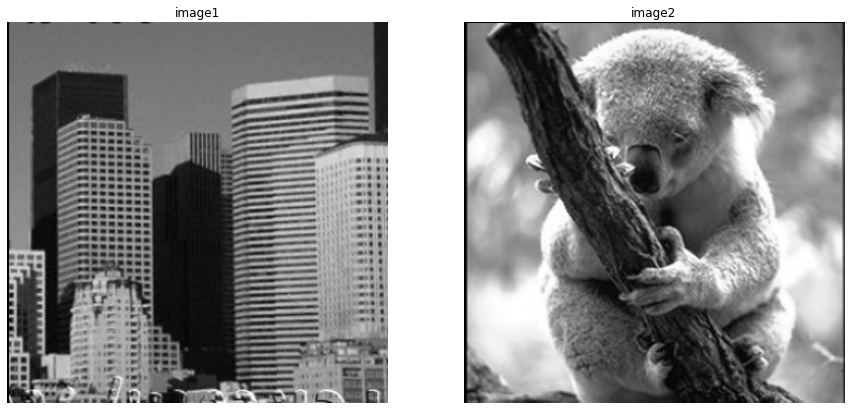

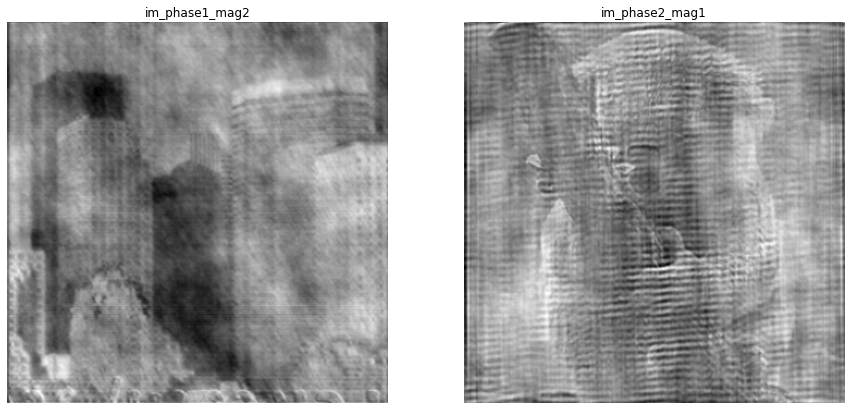

In [9]:
img1= cv2.imread(os.path.join(rootpath, "f2.1.png"),cv2.IMREAD_GRAYSCALE) 
img1=cv2.resize(img1,(350,350))
# Fourier transform
f = np.fft.fft2(img1)
f = np.fft.fftshift(f)

# Fourier phase and magnitude
phase1 = np.angle(f)
magnitude1 = np.abs(f)

img2= cv2.imread(os.path.join(rootpath, "f2.2.png"),cv2.IMREAD_GRAYSCALE) 
img2=cv2.resize(img2,(350,350))

# Fourier transform
f = np.fft.fft2(img2)
f = np.fft.fftshift(f)

# Fourier phase and magnitude
phase2 = np.angle(f)
magnitude2 = np.abs(f)

phase1_mag2 = np.multiply(magnitude2, np.exp(1j*phase1))
phase2_mag1 = np.multiply(magnitude1, np.exp(1j*phase2))

# Invert Fourier transform to get images
im_phase1_mag2 = np.real(np.fft.ifft2(np.fft.fftshift(phase1_mag2)))
im_phase2_mag1 = np.real(np.fft.ifft2(np.fft.fftshift(phase2_mag1 )))

fig,axs = plt.subplots(1,2)
fig.set_figwidth(15)
fig.set_figheight(15)
plt.subplot(1,2,1)
plt.imshow(img1 ,cmap='gray')  
plt.title('image1')
plt.axis('off')
 

plt.subplot(1,2,2)
plt.imshow(img2 ,cmap='gray')  
plt.title('image2')
plt.axis('off')
plt.show()

fig,axs = plt.subplots(1,2)
fig.set_figwidth(15)
fig.set_figheight(15)
plt.subplot(1,2,1)
plt.imshow(im_phase1_mag2, cmap='gray')  
plt.title('im_phase1_mag2')
plt.axis('off')

plt.subplot(1,2,2)
plt.imshow(im_phase2_mag1 ,cmap='gray')  
plt.title('im_phase2_mag1')
plt.axis('off')

plt.show()

#What aspects of the image are captured by the magnitude and the phase of the FT? 

## (3) Fourier transform a filter 

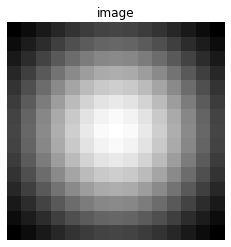

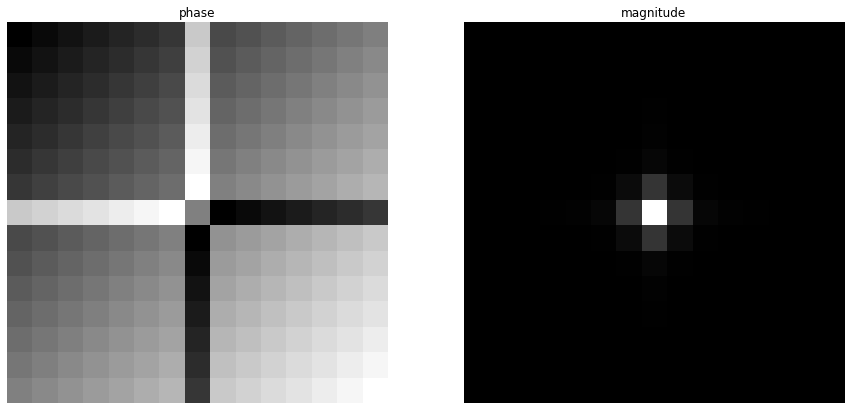

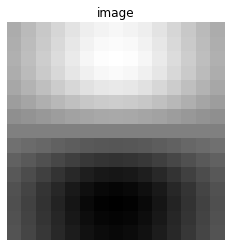

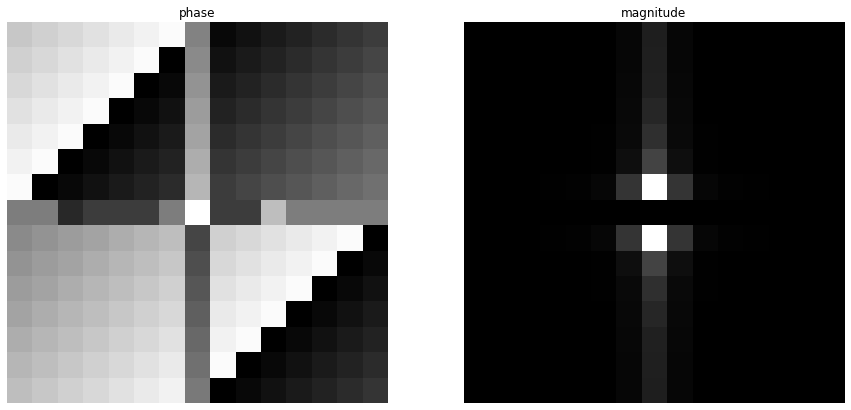

In [10]:
# Gaussian filter size 15
 
gau_kernel = cv2.getGaussianKernel(15,5)# 1d gaussian kernel (size, sigma)
gau_kern2d = np.outer(gau_kernel, gau_kernel)
gau_kern2d=gau_kern2d/gau_kern2d.sum()
  
# Fourier transform
f = np.fft.fft2(gau_kern2d)
f = np.fft.fftshift(f)

# Fourier phase and magnitude
phase = np.angle(f)
magnitude = np.abs(f)



plt.imshow(gau_kern2d ,cmap='gray')  
plt.title('image')
plt.axis('off')
plt.show()
             
fig,axs = plt.subplots(1,2)
fig.set_figwidth(15)
fig.set_figheight(15)
plt.subplot(1,2,1)
plt.imshow(phase ,cmap='gray')  
plt.title('phase')
plt.axis('off')

plt.subplot(1,2,2)
plt.imshow(magnitude ,cmap='gray')  
plt.title('magnitude')
plt.axis('off')

plt.show()


gau_kern2d=np.gradient(gau_kern2d,axis=0)

# Fourier transform
f = np.fft.fft2(gau_kern2d)
f = np.fft.fftshift(f)

# Fourier phase and magnitude
phase = np.angle(f)
magnitude = np.abs(f)



plt.imshow(gau_kern2d ,cmap='gray')  
plt.title('image')
plt.axis('off')
plt.show()
             
fig,axs = plt.subplots(1,2)
fig.set_figwidth(15)
fig.set_figheight(15)
plt.subplot(1,2,1)
plt.imshow(phase ,cmap='gray')  
plt.title('phase')
plt.axis('off')

plt.subplot(1,2,2)
plt.imshow(magnitude ,cmap='gray')  
plt.title('magnitude')
plt.axis('off')

plt.show()



## (4) Gaussian lowpass filter in the frequency domain

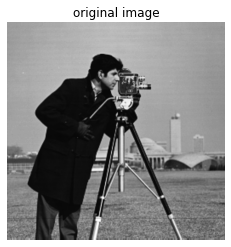

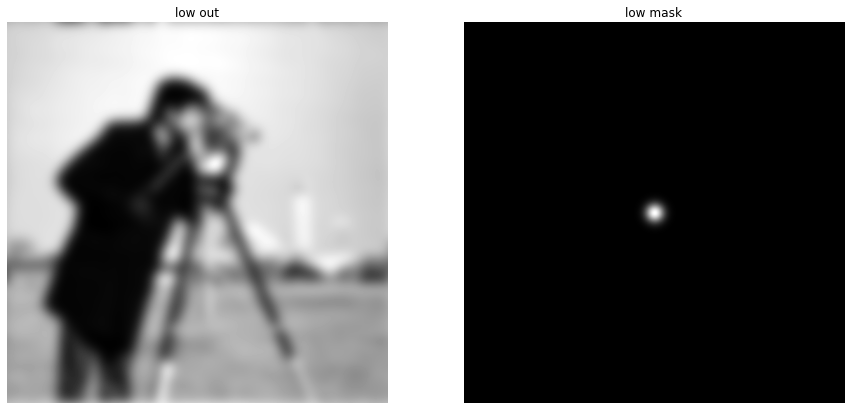

In [11]:

radius_low = 10

rootpath='./'
img= cv2.imread(os.path.join(rootpath, "f1.5.png"),cv2.IMREAD_GRAYSCALE) 

 
# Fourier transform
f = np.fft.fft2(img)
f = np.fft.fftshift(f)


def Gauss_LowPass(f,radius_low):  #        
    
    m = f.shape[0]
    n = f.shape[1]
    mask = np.zeros((m, n))
  
    x0 = np.floor(m/2)
    y0 = np.floor(n/2)
    for i in range(m):
        for j in range(n):
            dis = np.sqrt((i - x0)**2 + (j - y0)**2)
            mask[i][j] = np.exp((-1)*dis**2/2/(radius_low**2))
        
    
    result = np.multiply(f, mask) 
    return result,mask

 

f_low_filtered,mask_low = Gauss_LowPass(f,radius_low)
  

# Invert Fourier transform to get the filtered image
img_low = np.real(np.fft.ifft2(np.fft.fftshift(f_low_filtered)))


 


plt.imshow(img ,cmap='gray')  
plt.title('original image')
plt.axis('off')
plt.show()

fig,axs = plt.subplots(1,2)
fig.set_figwidth(15)
fig.set_figheight(15)
plt.subplot(1,2,1)
plt.imshow(img_low ,cmap='gray')  
plt.title('low out')
plt.axis('off')

plt.subplot(1,2,2)
plt.imshow(mask_low ,cmap='gray')  
plt.title('low mask')
plt.axis('off')

plt.show()



#  Exercise